In [1]:
from pathlib import Path

from lunarsky import Time
import healpy as hp
import matplotlib.pyplot as plt
import numpy as np

import lusee_faraday as ld

%matplotlib widget

In [2]:
NSIDE = 128
DATA_DIR = Path("/home/christian/Documents/research/lusee/lusee_faraday/data/")

In [3]:
def plot_beam(beam):
    hp.mollview(beam.jones_x[0], title="E_x^theta", cbar=True)#, min=-1, max=1)
    hp.mollview(beam.jones_x[1], title="E_x^phi", cbar=True)#, min=-1, max=1)
    hp.mollview(beam.jones_y[0], title="E_y^theta", cbar=True)#, min=-1, max=1)
    hp.mollview(beam.jones_y[1], title="E_y^phi", cbar=True)#, min=-1, max=1)

def plot_beam_power(gain_x, gain_y):
    hp.mollview(gain_x, cbar=True, title="X beam")#, min=0, max=1)
    hp.mollview(gain_y, cbar=True, title="Y beam")#, min=0, max=1) 

## Short dipole beam

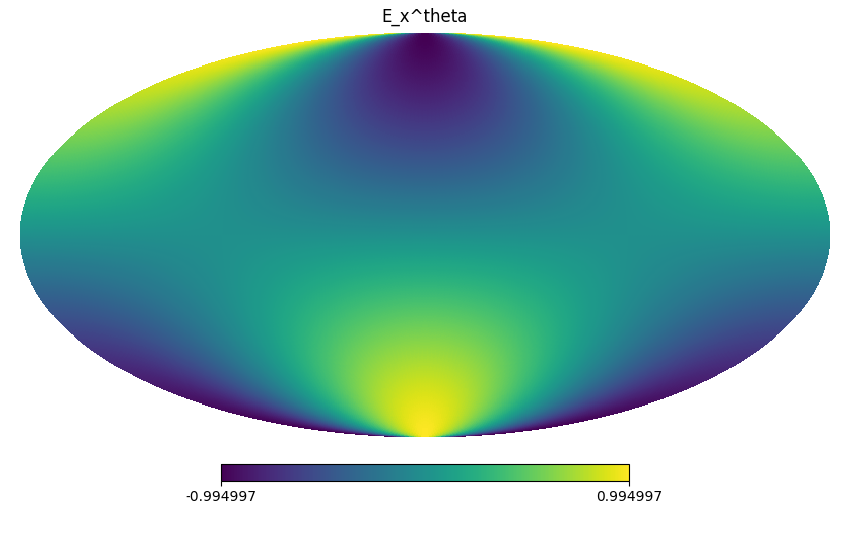

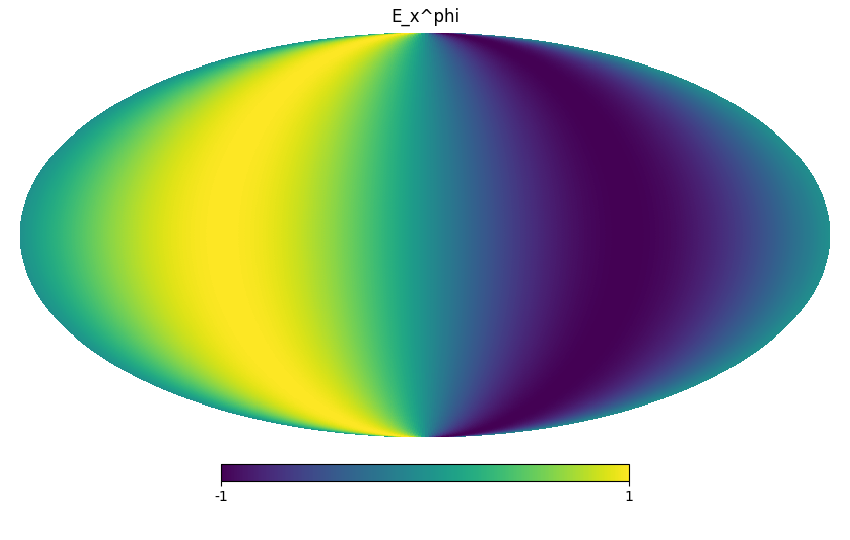

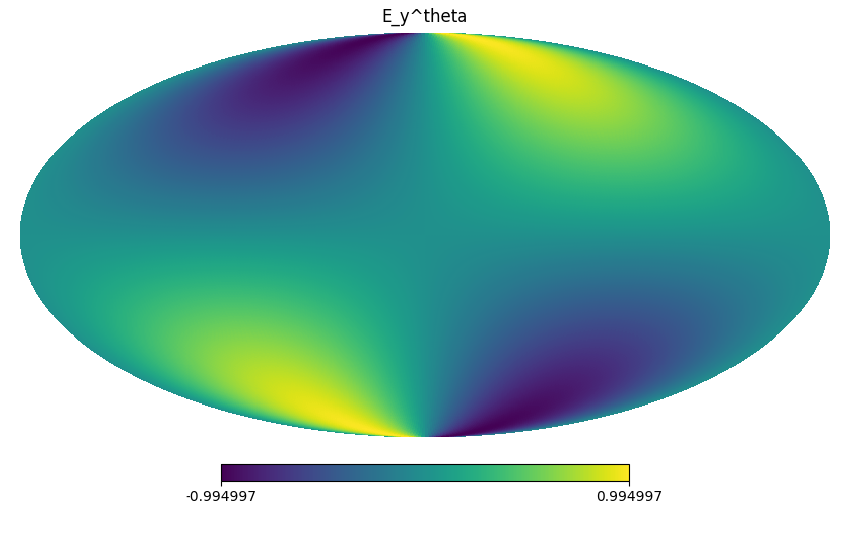

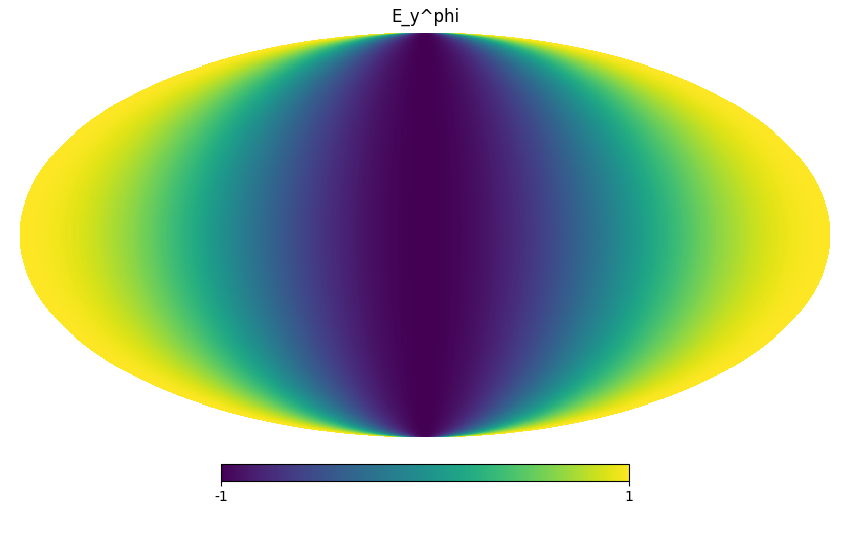

In [13]:
dipole = ld.Beam.short_dipole(nside=NSIDE)
plot_beam(dipole)

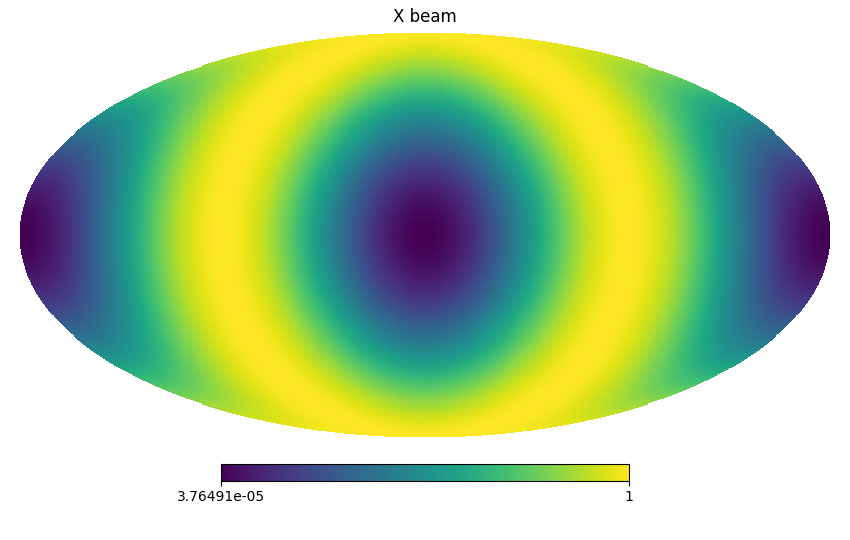

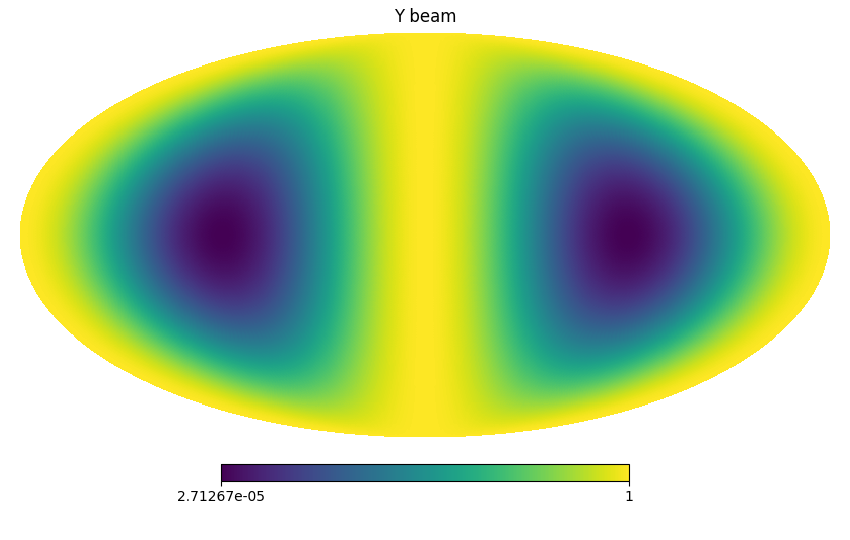

In [14]:
dipole.precompute_weights()

# the power beam
gain_x = 2 * dipole.weights["wI_x"]
gain_y = 2 * dipole.weights["wI_y"]

plot_beam_power(gain_x, gain_y)

## LuSEE beam

In [6]:
beam_file = DATA_DIR / "hfss_lbl_3m_75deg.2port.fits"
lusee_beam = ld.Beam.from_file(beam_file, frequency=30, nside=NSIDE)

/home/christian/Documents/research/lusee/lusee_faraday/.venv/lib/python3.12/site-packages/healpy/projector.py:200: ComplexWarning: Casting complex values to real discards the imaginary part
  img[w] = mpix


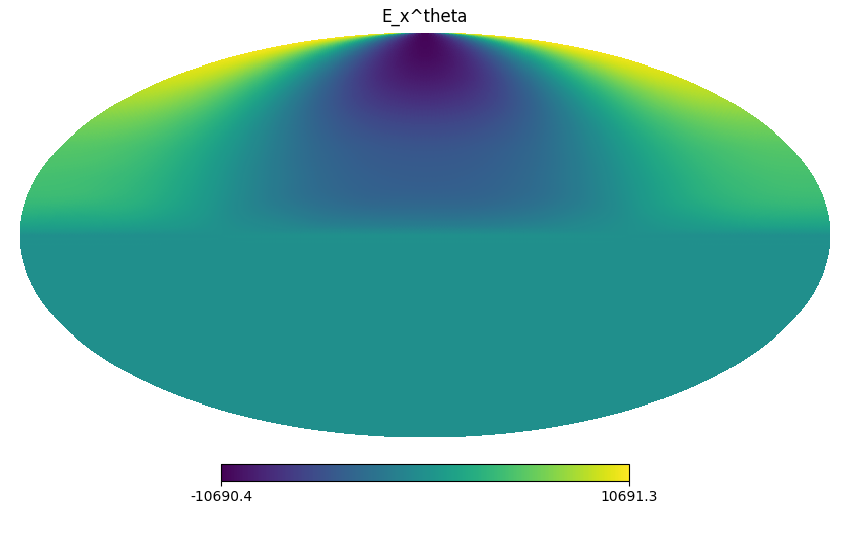

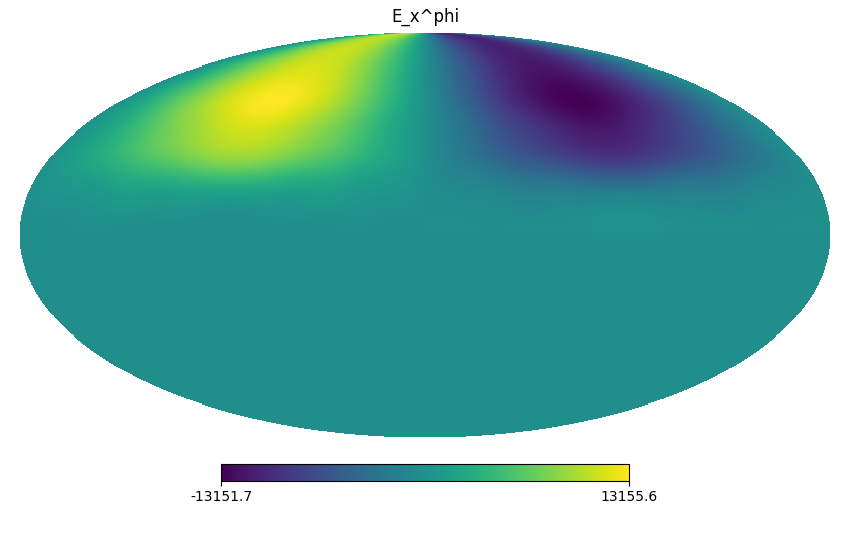

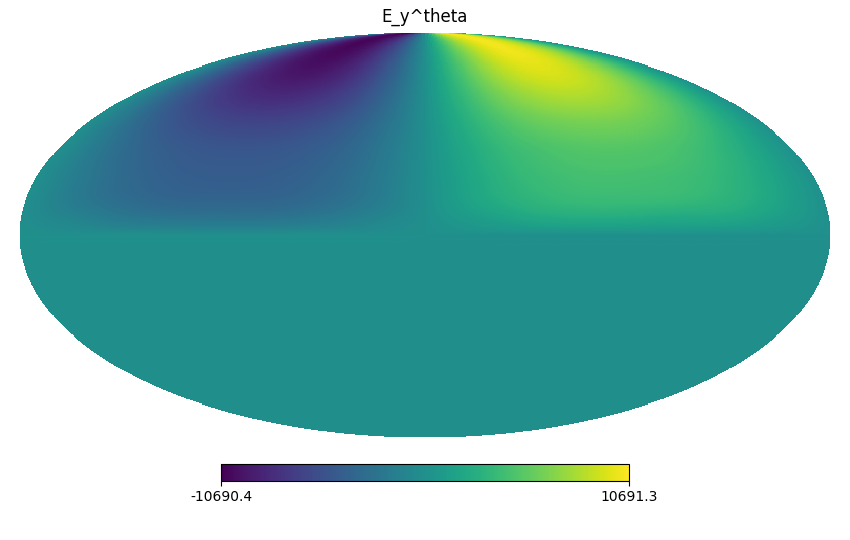

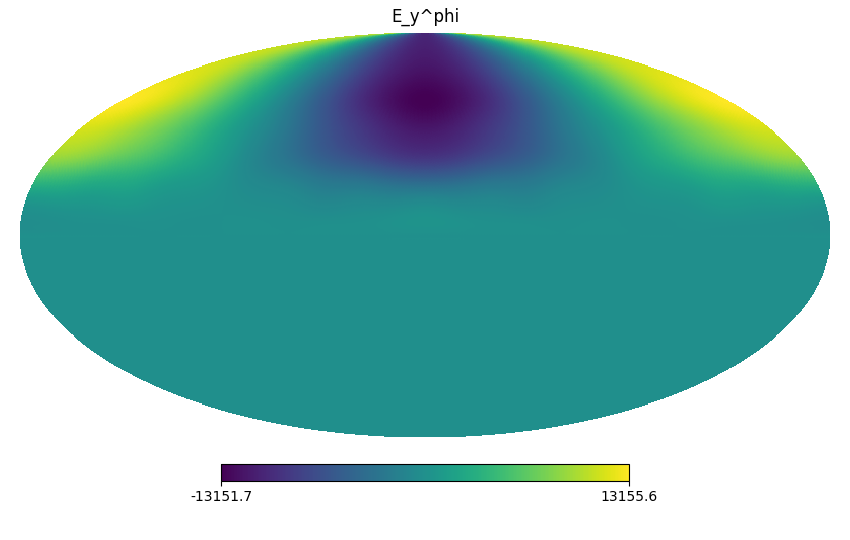

In [8]:
plot_beam(lusee_beam)

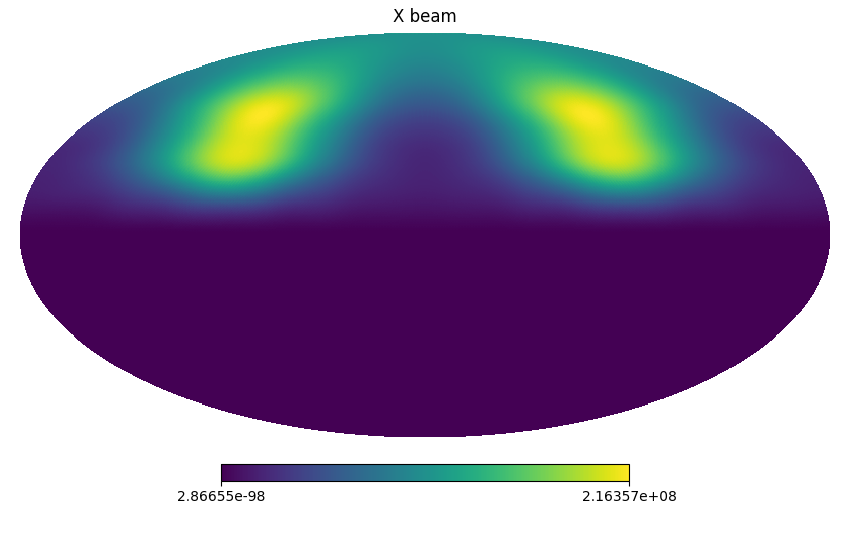

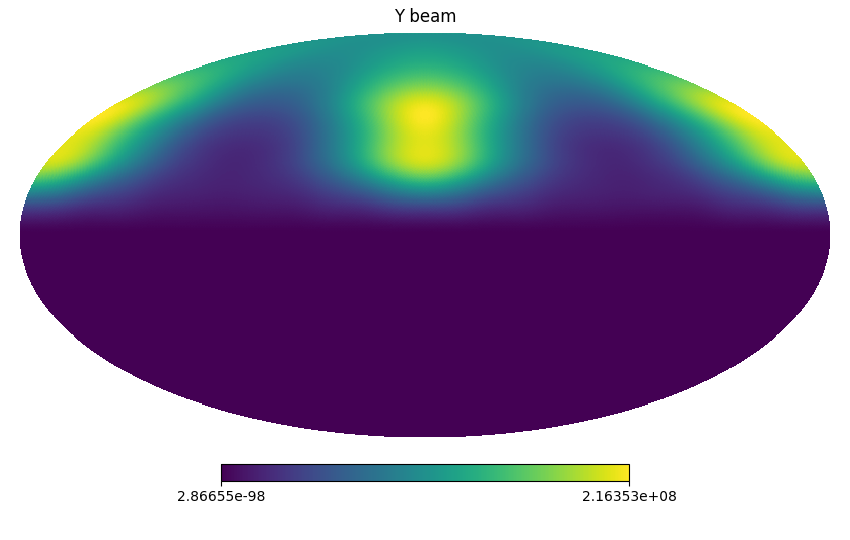

In [12]:
lusee_beam.precompute_weights()

# the power beam
gain_x = 2 * lusee_beam.weights["wI_x"]
gain_y = 2 * lusee_beam.weights["wI_y"]

plot_beam_power(gain_x, gain_y)

## Sky

In [4]:
def power_law(sky_maps, freqs, ref_freq, beta=-2.5):
    """
    Parameters
    ----------
    sky_maps : shape (Nmaps, npix)
    freqs : float or array of shape (nfreq,)
    ref_freq : float, same units as freqs
    beta : float

    Returns
    -------
    ndarray : shape (nfreq, Nmaps, npix)
    """
    base = np.atleast_1d(freqs)/ref_freq
    factor = base[:, None] ** beta
    return sky_maps[None] * factor

In [5]:
wmap_23ghz = ld.sky.load_wmap(DATA_DIR / "wmap_band_iqumap_r9_9yr_K_v5.fits", nside=NSIDE)
wmap = power_law(wmap_23ghz, 30, 23e3)
rm = ld.sky.load_rm(DATA_DIR / "faraday2020v2.hdf5")

In [6]:
sky = ld.SkyModel(wmap[0, 0], wmap[0, 1], wmap[0, 2], rm, freq=30, frame="galactic")
print(sky.frame, sky.freq)

galactic [30]


/tmp/ipykernel_517824/2421777604.py:1: RuntimeWarning: divide by zero encountered in log10
  hp.mollview(np.log10(sky.I_map[0]), cbar=True, title="I")


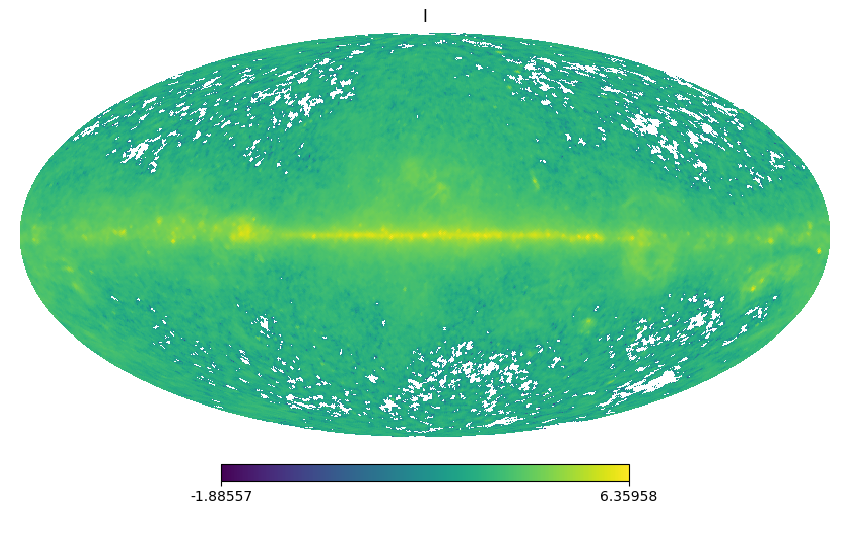

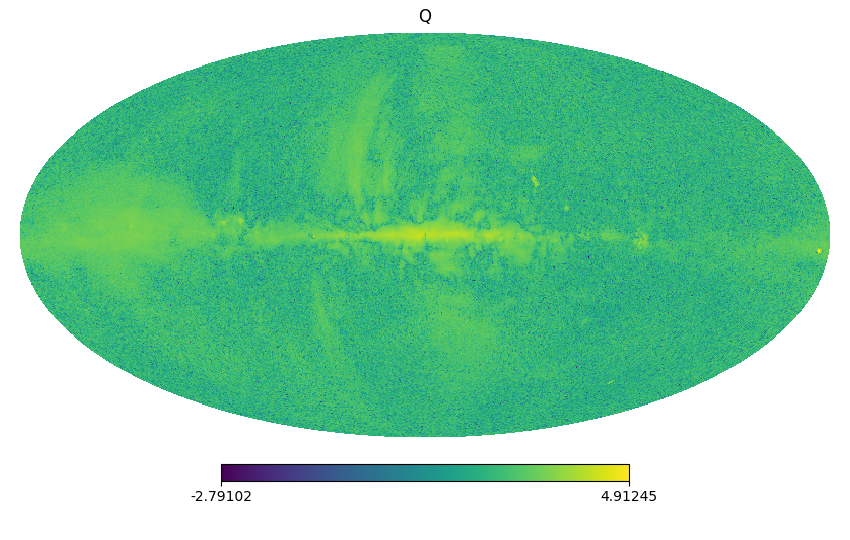

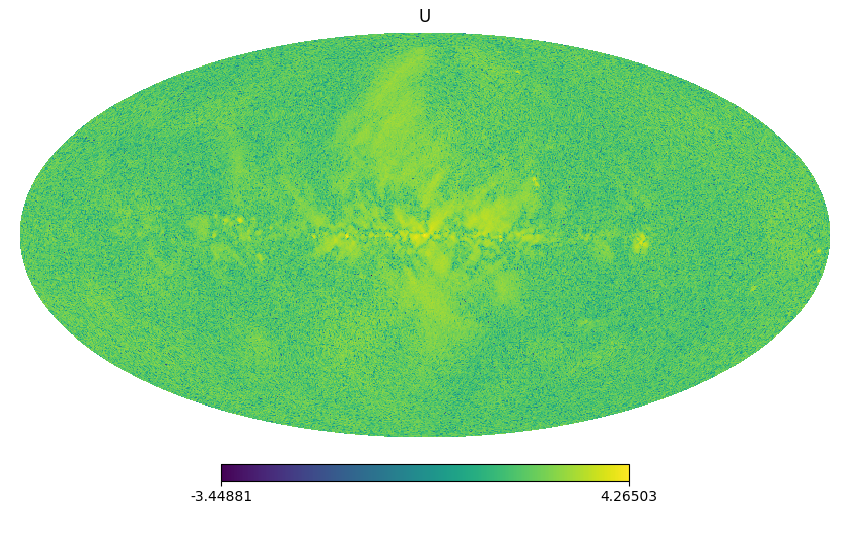

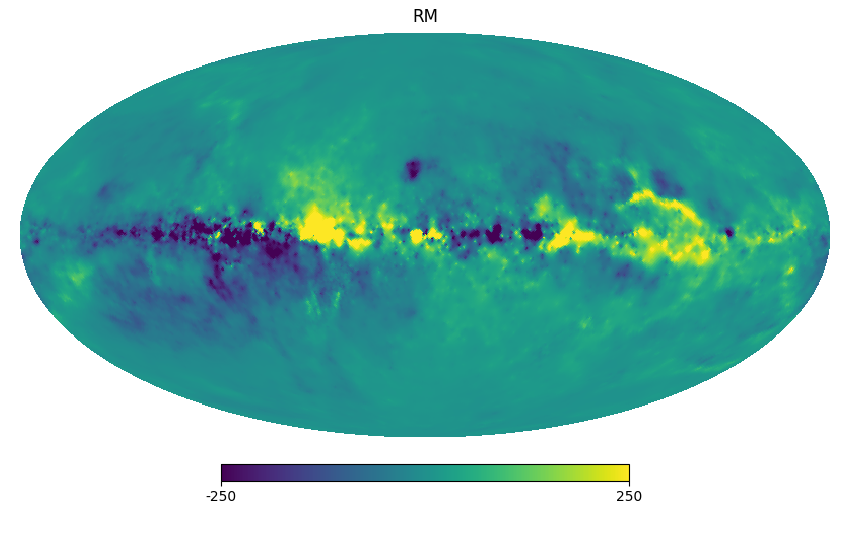

In [7]:
hp.mollview(np.log10(sky.I_map[0]), cbar=True, title="I")
hp.mollview(np.log10(np.abs(sky.Q_map[0])), cbar=True, title="Q")
hp.mollview(np.log10(np.abs(sky.U_map[0])), cbar=True, title="U")
hp.mollview(sky.RM_map, cbar=True, min=-250, max=250, title="RM")

In [8]:
faraday = True
if faraday:
    sky.apply_fd()

/tmp/ipykernel_517824/2756838637.py:1: RuntimeWarning: divide by zero encountered in log10
  hp.mollview(np.log10(sky.I_map[0]), cbar=True, title="I")


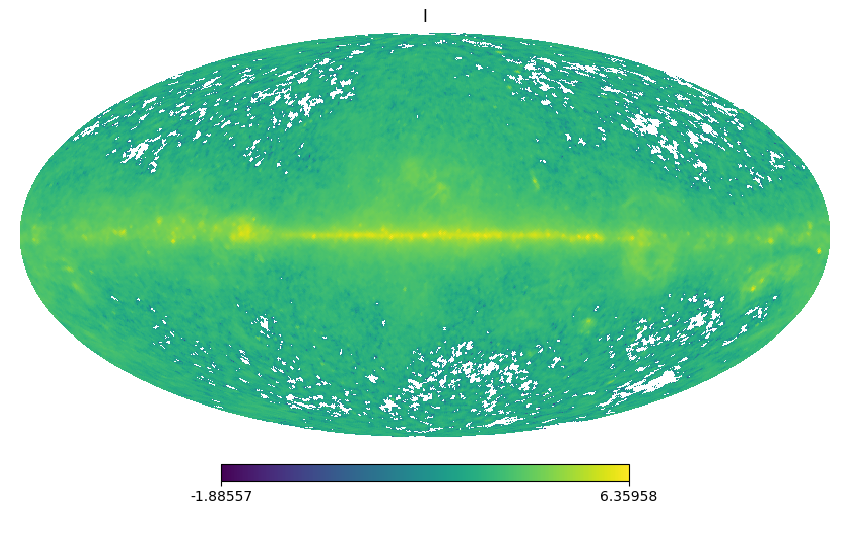

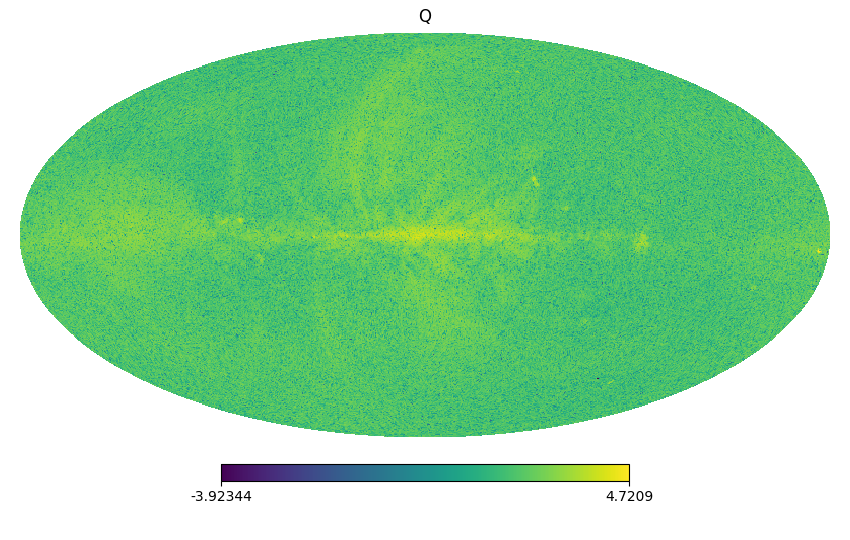

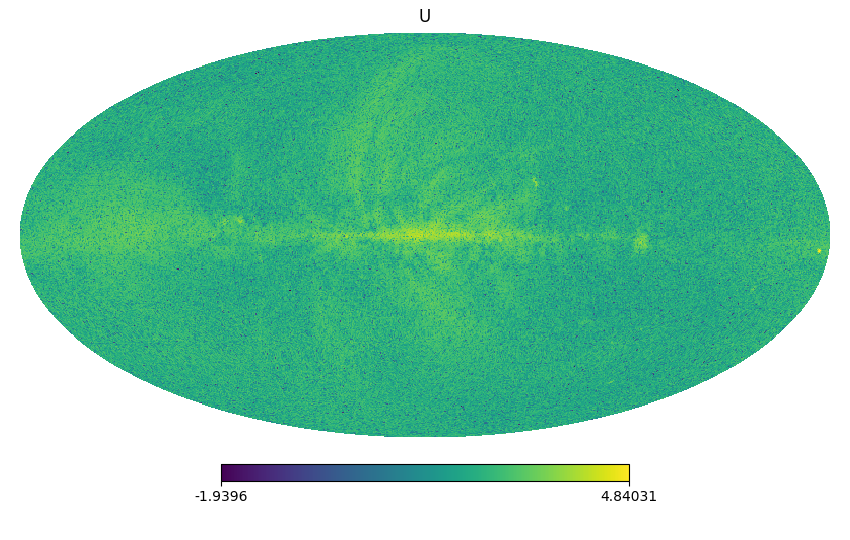

In [9]:
hp.mollview(np.log10(sky.I_map[0]), cbar=True, title="I")
hp.mollview(np.log10(np.abs(sky.Q_map[0])), cbar=True, title="Q")
hp.mollview(np.log10(np.abs(sky.U_map[0])), cbar=True, title="U")

/tmp/ipykernel_517824/62139343.py:3: RuntimeWarning: invalid value encountered in log10
  hp.mollview(np.log10(sky_topo[0, 0]), cbar=True, title="I")


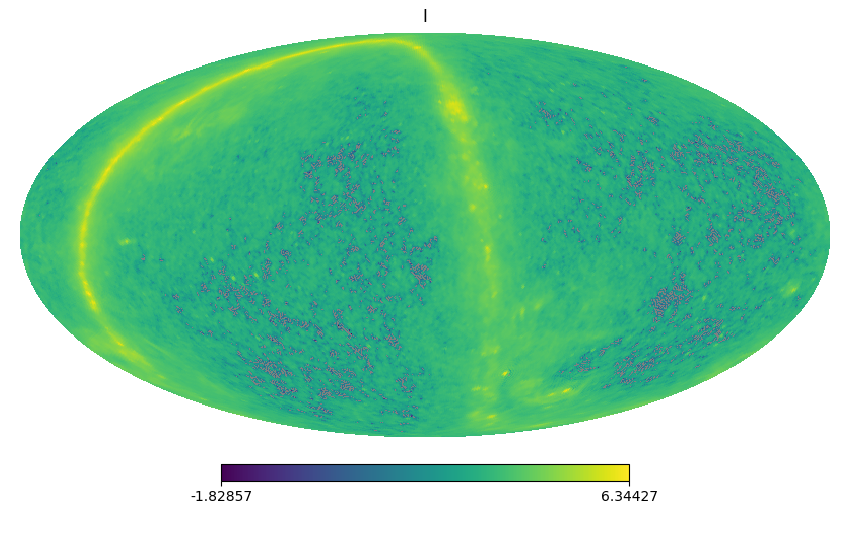

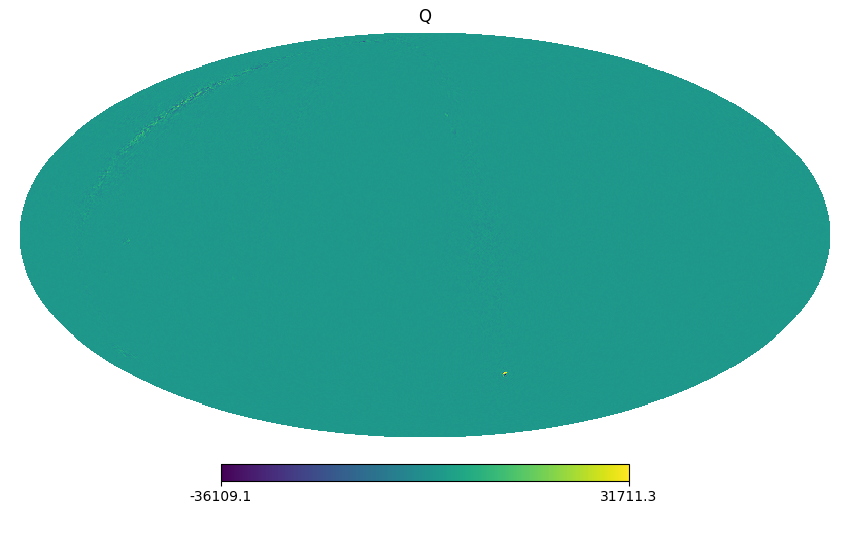

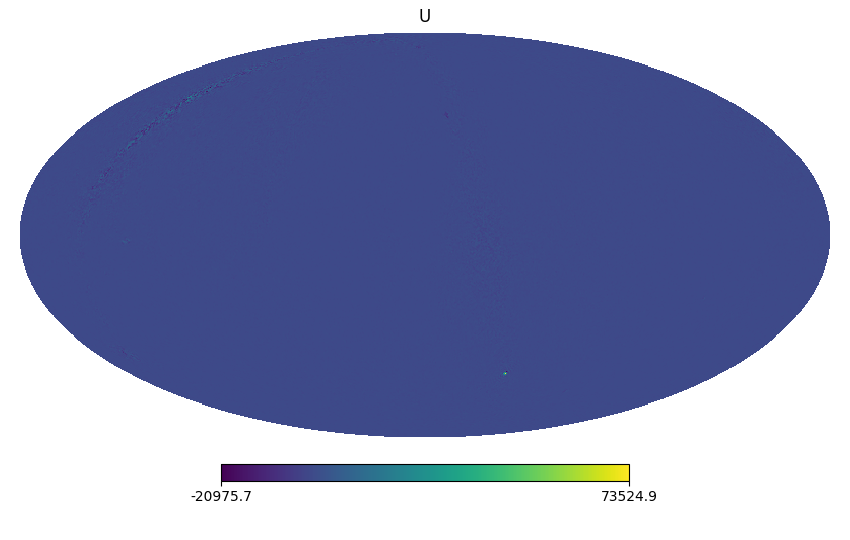

In [10]:
time = Time("2027-01-20T09:00:00")
sky_topo = sky.to_topocentric(time, loc="lusee")
hp.mollview(np.log10(sky_topo[0, 0]), cbar=True, title="I")
hp.mollview(sky_topo[1, 0], cbar=True, title="Q")
hp.mollview(sky_topo[2, 0], cbar=True, title="U")